In [7]:
pip install accelerate lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 21.9 kB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-5rkag1cf
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-5rkag1cf
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.2 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=5c19f61af7052d16051b1fe152408d2b3357c851ff19878e61c5bd7d3fbe9b87
  Stored in directory: /tmp/pip-ephem-wheel-cache-9bt_efox/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip
Note: you may need to restart the kernel to use updated packages.


## Initializing

In [9]:
# Стандартная библиотека
import os
import re
from typing import List, Tuple

# Сторонние библиотеки
import cv2
import lpips
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision.transforms as transforms
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

# Transformers и обработка текста
import clip
import tiktoken
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    CLIPModel,
    CLIPProcessor,
)

# Diffusers и модели генерации
from diffusers import (
    AutoPipelineForImage2Image,
    DDIMScheduler,
    LCMScheduler,
    StableDiffusion3Pipeline,
    StableDiffusionPipeline,
)
from diffusers.utils import load_image, make_image_grid

# Torch и нейросетевые модули
from torch import nn
from torch.nn import functional as F
from torchvision import models

# Датсеты
from datasets import load_dataset

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
def critic(prompt,tokenizer,model):
  
    base_prompt = f'''You get info about the story: Actions, Location, Characters
                    If everything looks correct, answer: YES, else NO
                    ANSWER ONLY YES OR NO
                    INFO:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a critic. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def story_deepthink(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story. You should think about it
                    You should in details describe the location and characters of this story
                    And describe the actions of the story.
                    Do it maximum illustrative
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a thinker. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_desсriber(prompt, location, tokenizer, model):
  
    base_prompt = f'''You've got the text of the story.
                    You should describe the {location} in this story this story
                    You can imagine how it looks like
                    Do it briefly
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_finder(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story.
                    Write a locations in which the actions in the story take place.
                    Highlight locations and write them with commas.
                    Be as concise as possible and do not write any extra words or characters or you will be punished
                    ONLY 1 WORD PER LOCATION
                    ACTION:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_matcher(prompt, location,tokenizer, model):
  
    base_prompt = f'''You've got the action and locations.
                    Write a location in which this actions may take place.
                    
                    ACTION:{prompt}
                    LOCATIONS:{location}
                    CHOOSE ONLY ONE LOCATION FROM A LIST DO NOT WRITE OTHER WORDS
                    USE WORDS FROM A LIST DO NOT CHANGE THEM
                    '''
    messages = [
        {"role": "system", "content": "You're a writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def char_desсriber(prompt,tokenizer, model):
  
    base_prompt = f'''You've got the text of the story.
                    You should list the characters
                    Do not use names, descrivbe them in general according their roles
                    Do not use extra words and symbols
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def describe_story(prompt,tokenizer, model):
  
    base_prompt = f'''You get a story to input.
                      Your task is to write the description for the Characters and the Location.
                      You can imagine them
                      Describe it briefly in details
                      WRITE ONLY DESCRIPTIONS!!!
                      Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=70
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def generate_response(prompt,tokenizer, model, parts = 3):
  
    base_prompt = f'''  You need to divide the text ONLY into {parts} actions and describe them, ONLY {parts}, NOT MORE!!!!
                        Seperate each main ACTION and begin with token '[ACTION]'
                        Do not use any characters except letters, numbers, and the dot and comma sign.
                        DO NOT USE OTHER TOKENS!!!!
                        THERE ARE MUST BE ONLY {parts} PARTS!!!!
                        Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional text writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

def clean_text(text):
    # Регулярное выражение для оставления только букв, цифр, точек и запятых
    cleaned_text = re.sub(r"[^][a-zA-Z0-9 .,]", "", text)
    return cleaned_text

def merge_actions(actions, num=3):
    if len(actions) <= num:
        return actions
    else:
        # Если частей больше 3, объединяем их равномерно
        step = len(actions) // num  # Определяем шаг для объединения
        merged_actions = [
            " ".join(actions[i:i + step]) for i in range(0, len(actions), step)
        ]
        # Если после объединения осталось больше 3 частей, объединяем последние
        if len(merged_actions) > num:
            merged_actions[2] += " " + " ".join(merged_actions[num:])
            merged_actions = merged_actions[:num]
        return merged_actions

## Full Pipeline

In [ ]:
def calculate_clip_score(image: str, text: str, model_name: str = "ViT-B/32") -> float:
    """
    Вычисляет CLIP Score — меру соответствия между изображением и текстом.
    
    Параметры:
        image_path (str): Путь к изображению.
        text (str): Текст для сравнения.
        model_name (str): Название модели CLIP (по умолчанию "ViT-B/32").
    
    Возвращает:
        float: Значение CLIP Score (косинусное сходство между эмбеддингами).
    """
    # Загрузка модели и предобработки
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load(model_name, device=device)
    
    # Загрузка и предобработка изображения
    image = preprocess(image).unsqueeze(0).to(device)
    
    # Токенизация текста
    text_tokens = clip.tokenize([text]).to(device)
    
    # Вычисление эмбеддингов
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text_tokens)
    
    # Косинусное сходство
    clip_score = torch.cosine_similarity(image_features, text_features).item()
    
    return clip_score

In [ ]:
def calculate_lpips(image_path1: str, image_path2: str, net_type: str = 'alex') -> float:
    """
    Вычисляет метрику LPIPS между двумя изображениями.

    Параметры:
        image_path1 (str): Путь к первому изображению.
        image_path2 (str): Путь ко второму изображению.
        net_type (str): Модель для вычисления ('alex', 'vgg', 'squeeze').

    Возвращает:
        float: Значение LPIPS (чем меньше, тем более схожи изображения).
    """
    # Инициализация LPIPS
    loss_fn = lpips.LPIPS(net=net_type).eval()
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    loss_fn.to(device)

    def load_image(path):
        img = path#Image.open(path).convert('RGB')
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        return transform(img).unsqueeze(0).to(device)

    img1 = load_image(image_path1)
    img2 = load_image(image_path2)

    # Расчет LPIPS
    with torch.no_grad():
        distance = loss_fn(img1, img2).item()

    return distance

# Единичные запросы

### LLM Агенты

In [ ]:
def location_finder(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story.
                    Write a locations in which the actions in the story take place.
                    Be brief as possible and write locations with commas
                    WRITE ONLY LOCATIONS DO NOT WRITE EXTRA WORDS
                    STORY:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def parse_characters(input_str):
    # Удаляем заголовок "Characters:" (регистронезависимо)
    input_str = re.sub(r'^.*characters:.*$', '', input_str, flags=re.IGNORECASE | re.MULTILINE)
    
    # Находим все элементы списка
    entries = re.findall(r'^\s*-\s*(.*?)\s*$', input_str, flags=re.MULTILINE)
    
    # Очистка и форматирование каждого элемента
    cleaned_entries = []
    for entry in entries:
        # Удаляем лишние символы, кроме букв, цифр, пробелов и скобок
        entry = re.sub(r'[^\w\s()]', '', entry)
        # Убираем лишние пробелы
        entry = re.sub(r'\s+', ' ', entry).strip()
        # Приводим к Title Case (первые буквы слов заглавные)
        entry = entry.title()
        cleaned_entries.append(entry)
    
    return ', '.join(cleaned_entries)

In [ ]:
def parse_actions(input_str):
    # Разделяем по [ACTION] в любом регистре
    actions = re.split(r'\[ACTION\]', input_str, flags=re.IGNORECASE)
    
    # Очищаем от пустых строк и лишних пробелов
    cleaned_actions = [action.strip() for action in actions if action.strip()]
    
    return cleaned_actions

In [ ]:
def create_story_report(story_ls: list, characters: list, location_ls: list) -> str:
    """
    Объединяет списки сюжетов, персонажей и локаций в форматированный текстовый отчет.
    
    Параметры:
        story_ls: Список сюжетных событий
        characters: Список персонажей (с атрибутами)
        location_ls: Список локаций
    
    Возвращает:
        str: Форматированный текстовый отчет
    """
    # Заголовок и сюжет
    report = "📖 СЮЖЕТНЫЕ СОБЫТИЯ:\n"
    report += "\n".join(f"→ {i+1}. {story}" for i, story in enumerate(story_ls))
    
    # Персонажи
    report += "\n\n🎭 ПЕРСОНАЖИ:\n"
    if isinstance(characters, dict):  # Если characters - словарь
        report += "\n".join(f"• {name}: {desc}" for name, desc in characters.items())
    else:  # Если characters - список
        report += "\n".join(f"• {char}" for char in characters)
    
    # Локации
    report += "\n\n🌍 ЛОКАЦИИ:\n"
    unique_locations = list(set(location_ls))  # Уникальные локации
    report += "\n".join(f"📍 {loc}" for loc in unique_locations)
    
    
    return report

In [ ]:
def llm_agents(story: str,tokenizer, model) -> Tuple[List[str], dict, List[str]]:
    """Генерация согласованных story_ls и location_ls с контролем длины токенов."""
    enc = tiktoken.get_encoding("cl100k_base")
    
    def count_tokens(text: str) -> int:
        return len(enc.encode(text))

    # 1. Получение персонажей (без ограничений токенов)
    characters = parse_characters(char_desсriber(story,tokenizer, model))
    
    # 2. Генерация story_ls (макс 3 попытки)
    story_ls = []
    for _ in range(3):
        story_ls = merge_actions(parse_actions(generate_response(story,tokenizer, model)))
        if all(count_tokens(item) < 77 for item in story_ls):
            break
    else:
        story_ls = [s[:70] + "..." for s in story_ls]  # Принудительная обрезка
    
    # 3. Генерация location_ls (макс 3 попытки)
    locations_raw = location_finder(story,tokenizer, model)
    location_ls = []
    
    for attempt in range(3):
        location_ls = []
        for story_item in story_ls:
            loc = location_matcher(story_item, locations_raw,tokenizer, model)
            location_ls.append(loc[:70] + "..." if count_tokens(loc) >= 77 else loc)
        
        # Корректировка длины
        if len(location_ls) != len(story_ls):
            diff = len(story_ls) - len(location_ls)
            filler = location_ls[0] if len(set(location_ls)) == len(location_ls) else location_ls[-1]
            location_ls.extend([filler] * diff)
        
        # Проверка успешности
        if (len(location_ls) == len(story_ls) and 
            all(count_tokens(loc) < 77 for loc in location_ls)):
            if 'yes' in critic(create_story_report(story_ls, characters, location_ls),tokenizer, model).lower():
                break
    
    # Финальные гарантии
    story_ls = [s if count_tokens(s) < 77 else s[:70] + "..." for s in story_ls]
    location_ls = location_ls[:len(story_ls)]
    location_ls = [loc if count_tokens(loc) < 77 else loc[:70] + "..." 
                  for loc in location_ls]
    
    return story_ls, characters, location_ls

In [ ]:
#negative_prompt = 'poorly Rendered face, poorly drawn face ,poor facial details, poorly drawn hands, poorly rendered hands,low resolution, blurry image, disfigured, oversaturated, bad anatomy, deformed body features'

In [ ]:
def generate_best_character_image(pipeline, characters: str, generator, empty_image, show_results: bool = False) -> Image.Image:
    """
    Генерирует 3 изображения персонажа и возвращает лучшее по CLIP Score.
    
    Параметры:
        pipeline: Пайплайн для генерации изображений
        characters (str): Описание персонажа
        generator: Генератор для воспроизводимости
        empty_image: Изображение для IP-адаптера
        show_results (bool): Показывать все варианты (по умолчанию False)
    
    Возвращает:
        Image.Image: Лучшее изображение по CLIP Score
    """
    pipeline.set_ip_adapter_scale(0)
    
    # Генерация 3 вариантов
    generated_images = []
    clip_scores = []
    
    for i in range(3):
        char_img = pipeline(
            prompt=f'Illustration {characters}',
            ip_adapter_image=empty_image,
            negative_prompt="lowres, bad anatomy, worst quality, low quality",
            num_inference_steps=50,
            generator=generator,
        ).images[0]
        
        score = calculate_clip_score(char_img, characters)
        generated_images.append(char_img)
        clip_scores.append(score)
        
        if show_results:
            plt.figure(figsize=(5, 5))
            plt.imshow(char_img)
            plt.title(f"Вариант {i+1} - CLIP: {score:.4f}")
            plt.axis('off')
            plt.show()
    
    # Выбор лучшего изображения
    best_idx = np.argmax(clip_scores)
    best_image = generated_images[best_idx]
    best_score = clip_scores[best_idx]
    
    print(f"Лучший CLIP Score: {best_score:.4f} (вариант {best_idx+1})")
    
    if show_results:
        plt.figure(figsize=(6, 6))
        plt.imshow(best_image)
        plt.title(f"Лучший результат - CLIP: {best_score:.4f}")
        plt.axis('off')
        plt.show()
    
    return best_image



In [ ]:
def generate_backgrounds_with_quality_check(
    pipeline,
    characters: str,
    location_ls: list,
    char_image: Image.Image,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    min_lpips_quality: float = 0.5,
    max_attempts: int = 3
) -> dict:
    """
    Генерирует фоны для локаций с проверкой качества через LPIPS.
    
    Параметры:
        pipeline: Пайплайн для генерации изображений
        characters (str): Описание персонажа
        location_ls: Список уникальных локаций
        char_image: Изображение персонажа для сравнения
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        min_lpips_quality: Минимальное требуемое качество (1 - LPIPS)
        max_attempts: Максимальное число попыток генерации
    
    Возвращает:
        dict: Словарь {локация: Image} с гарантированным качеством
    """
    pipeline.set_ip_adapter_scale(0.2)
    background_dict = {}
    
    for loc in list(set(location_ls)):
        for attempt in range(max_attempts):
            # Генерация фона
            background = pipeline(
                prompt=f'High-quality illustration of {characters} in {loc}',
                ip_adapter_image=char_image,
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Проверка качества
            lpips_score = calculate_lpips(char_image, background)
            quality = 1 - lpips_score
            
            if quality >= min_lpips_quality:
                background_dict[loc] = background
                print(f"✓ Локация '{loc}': качество {quality:.4f} (попытка {attempt+1})")
                break
                
            print(f"× Локация '{loc}': качество {quality:.4f} < {min_lpips_quality} (попытка {attempt+1})")
            
            if attempt == max_attempts - 1:
                background_dict[loc] = background  # Сохраняем лучший из неудачных вариантов
                print(f"⚠ Для локации '{loc}' достигнут максимум попыток. Лучшее качество: {quality:.4f}")
    
    # Визуализация результатов
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(char_image)
    plt.title("Персонаж")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    first_loc = next(iter(background_dict))
    plt.imshow(background_dict[first_loc])
    plt.title(f"Фон: {first_loc}\nLPIPS качество: {1 - calculate_lpips(char_image, background_dict[first_loc]):.4f}")
    plt.axis('off')
    
    plt.show()
    
    return background_dict



In [ ]:
def generate_best_story_frames(
    pipeline,
    story_ls: list,
    location_ls: list,
    background_dict: dict,
    characters: str,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    num_variants: int = 3,
    min_lpips: float = 0.5,
    display: bool = True,
    ip_adapter_scale: float = 0.2,
) -> list:
    """
    Генерирует лучшие кадры для историй с двойной проверкой качества (CLIP + LPIPS).
    
    Параметры:
        pipeline: Пайплайн генерации
        story_ls: Список историй
        location_ls: Список соответствующих локаций
        background_dict: Словарь фонов {локация: Image}
        characters: Описание персонажей
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        num_variants: Количество вариантов на историю
        min_lpips: Минимальное требование к LPIPS (1 - расстояние)
        display: Показывать результаты
    
    Возвращает:
        list: Лучшие изображения для каждой истории
    """
    pipeline.set_ip_adapter_scale(ip_adapter_scale)
    best_frames = []
    best_clips = []
    best_lpips = []
    
    for i, (story, loc) in enumerate(zip(story_ls, location_ls)):
        top_candidates = []
        
        # Генерация вариантов
        for _ in range(num_variants):
            img = pipeline(
                prompt=f'Illustration: {story} with {characters}',
                ip_adapter_image=background_dict.get(loc),
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Вычисление метрик
            clip_score = calculate_clip_score(img, story)
            lpips_dist = calculate_lpips(background_dict[loc], img)
            lpips_quality = 1 - lpips_dist
            
            top_candidates.append({
                'image': img,
                'clip': clip_score,
                'lpips': lpips_quality,
                'combined_score': clip_score * (lpips_quality if lpips_quality >= min_lpips else 0)
            })
        
        # Выбор лучшего по комбинированному score
        top_candidates.sort(key=lambda x: x['combined_score'], reverse=True)
        best = top_candidates[0]
        best_frames.append(best['image'])
        best_clips.append(best['clip'])
        best_lpips.append(best['lpips'])
        if display:
            print(f"История {i+1}:")
            print(f"  CLIP: {best['clip']:.4f} | LPIPS: {best['lpips']:.4f}")
            print(f"  Текст: {story[:50]}...")
    
    # Визуализация
    if display:
        plt.figure(figsize=(20, 5))
        for idx, img in enumerate(best_frames):
            plt.subplot(1, len(best_frames), idx + 1)
            plt.imshow(img)
            plt.title(f"Кадр {idx+1}\n{story_ls[idx][:30]}...")
            plt.axis("off")
        plt.tight_layout()
        plt.show()
    
    return best_frames, best_clips, best_lpips

In [ ]:
def save_images(image_list, num_act, output_dir="output_images", prefix="frame"):
    """
    Сохраняет список изображений в указанную директорию
    
    :param image_list: Список объектов PIL.Image
    :param output_dir: Папка для сохранения (по умолчанию "output_images")
    :param prefix: Префикс имен файлов (по умолчанию "frame")
    """
    # Создаем папку, если ее нет
    os.makedirs(output_dir, exist_ok=True)
    
    for i, img in enumerate(image_list):
        # Формируем имя файла: frame_1.jpg, frame_2.jpg и т.д.
        filename = f"{prefix}_{str(num_act)}_{i+1}.jpg"
        filepath = os.path.join(output_dir, filename)
        
        # Сохраняем изображение в формате JPEG
        img.save(filepath, "JPEG", quality=95)
        print(f"Сохранено: {filepath}")

In [ ]:
def gen_img(text,
           use_lora = True):

    ## LLM
    model_name = "Qwen/Qwen2.5-1.5B-Instruct" 
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="cuda").to("cuda")
    
    ## Stable Diffusion
    pipeline = StableDiffusionPipeline.from_pretrained(
        "stable-diffusion-v1-5/stable-diffusion-v1-5",
        torch_dtype=torch.float16,
    ).to("cuda")
    
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
    pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
    
    pipeline.set_ip_adapter_scale(0.2)

    if use_lora:
        pipeline.scheduler = LCMScheduler.from_config(pipeline.scheduler.config)
        pipeline.load_lora_weights("/kaggle/input/load-lora-weights-pipe-unet-load-attn-procs/out/")
        pipeline.fuse_lora()
    
    # Создание пустого изображения
    #empty_image = Image.new("RGB", (512, 512), (255, 255, 255))  # Белый фон, размер 512x512
    width, height = 512, 512
    
    # Создаем массив случайных значений (шум) в диапазоне [0, 255]
    empty_image = np.random.randint(0, 256, (height, width, 3), dtype=np.uint8)
    
    generator = torch.Generator(device="cpu").manual_seed(26)

    story_ls, characters, location_ls = llm_agents(stories[i],tokenizer, model)
    
    story_report = create_story_report(
                                    story_ls=story_ls,
                                    characters=characters,
                                    location_ls=location_ls)

    best_char_image = generate_best_character_image(
                                                    pipeline=pipeline,
                                                    characters=characters,
                                                    generator=generator,
                                                    empty_image=empty_image,
                                                    show_results=True)

    background_dict = generate_backgrounds_with_quality_check(
                                                            pipeline=pipeline,
                                                            characters=characters,
                                                            location_ls=location_ls,
                                                            char_image=best_char_image,
                                                            generator=generator,
                                                            min_lpips_quality=0.5)

    best_frames, best_clips, best_lpips = generate_best_story_frames(
                                                                    pipeline=pipeline,
                                                                    story_ls=story_ls,
                                                                    location_ls=location_ls,
                                                                    background_dict=background_dict,
                                                                    characters=characters,
                                                                    generator=generator)
    
    return best_frames, best_clips, best_lpips
        

## Полный Pipeline

In [ ]:
from datasets import load_dataset

# Загрузка датасета
ds = load_dataset("roneneldan/TinyStories")

# Извлечение первых 100 историй из тренировочного набора данных
stories = ds['train']['text'][:100]

# Удаление датасета для освобождения памяти (опционально)
del ds

In [ ]:
len(stories)

In [ ]:
stories = stories[20:]

In [ ]:
import csv
import json
import numpy as np
from tqdm import tqdm
from datetime import datetime

# Ваши существующие переменные
clip_ls = []
lpip_ls = []

def save_metrics_to_file(clip_scores, lpips_scores, filename_prefix="metrics"):
    """Сохраняет метрики в CSV и JSON файлы"""
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    
    # Подготовка данных
    metrics_data = {
        "clip_scores": clip_scores,
        "lpips_scores": lpips_scores,
        "clip_mean": float(np.mean(clip_scores)),
        "lpips_mean": float(np.mean(lpips_scores)),
        "timestamp": timestamp
    }
    
    # Сохранение в JSON
    json_filename = f"{filename_prefix}_{timestamp}.json"
    with open(json_filename, 'w') as json_file:
        json.dump(metrics_data, json_file, indent=4)
    
    # Сохранение в CSV
    csv_filename = f"{filename_prefix}_{timestamp}.csv"
    with open(csv_filename, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Index', 'CLIP Score', 'LPIPS Score'])
        for i, (clip, lpips) in enumerate(zip(clip_scores, lpips_scores)):
            writer.writerow([i+1, clip, lpips])
        writer.writerow(['Mean', np.mean(clip_scores), np.mean(lpips_scores)])
    
    return json_filename, csv_filename

# Модифицированный основной цикл
for i in tqdm(range(40)):
    best_frames, best_clips, best_lpips = gen_img(stories[i])
    save_images(best_frames, num_act=i)
    
    clip_ls.append(np.mean(best_clips))
    lpip_ls.append(np.mean(best_lpips))
    
    # Периодическое сохранение (каждые 5 итераций)
    if (i + 1) % 5 == 0 or i == 9:
        json_file, csv_file = save_metrics_to_file(clip_ls, lpip_ls)
        print(f"\nМетрики сохранены в файлы: {json_file} и {csv_file}")

# Финальное сохранение
json_file, csv_file = save_metrics_to_file(clip_ls, lpip_ls)
print(f"\nФинальные метрики сохранены в файлы: {json_file} и {csv_file}")

## Без IP

In [11]:
from datasets import load_dataset

# Загрузка датасета
ds = load_dataset("roneneldan/TinyStories")

# Извлечение первых 100 историй из тренировочного набора данных
stories = ds['train']['text'][:20]

# Удаление датасета для освобождения памяти (опционально)
del ds

In [12]:
def generate_response(prompt,tokenizer, model, parts = 3):
  
    base_prompt = f'''  You need to divide the text ONLY into {parts} actions and describe them, ONLY {parts}, NOT MORE!!!!
                        Seperate each main ACTION and begin with token '[ACTION]'
                        Do not use any characters except letters, numbers, and the dot and comma sign.
                        DO NOT USE OTHER TOKENS!!!!
                        THERE ARE MUST BE ONLY {parts} PARTS!!!!
                        Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional text writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

def clean_text(text):
    # Регулярное выражение для оставления только букв, цифр, точек и запятых
    cleaned_text = re.sub(r"[^][a-zA-Z0-9 .,]", "", text)
    return cleaned_text

def merge_actions(actions, num=3):
    if len(actions) <= num:
        return actions
    else:
        # Если частей больше 3, объединяем их равномерно
        step = len(actions) // num  # Определяем шаг для объединения
        merged_actions = [
            " ".join(actions[i:i + step]) for i in range(0, len(actions), step)
        ]
        # Если после объединения осталось больше 3 частей, объединяем последние
        if len(merged_actions) > num:
            merged_actions[2] += " " + " ".join(merged_actions[num:])
            merged_actions = merged_actions[:num]
        return merged_actions
        
def parse_actions(input_str):
    # Разделяем по [ACTION] в любом регистре
    actions = re.split(r'\[ACTION\]', input_str, flags=re.IGNORECASE)
    
    # Очищаем от пустых строк и лишних пробелов
    cleaned_actions = [action.strip() for action in actions if action.strip()]
    
    return cleaned_actions

In [13]:
def generate_best_story_frames_sequential(
    pipeline,
    story_ls: list,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    num_variants: int = 3,
    min_lpips: float = 0.5,
    display: bool = True,
    initial_ip_adapter_scale: float = 0.0,
    subsequent_ip_adapter_scale: float = 0.2,
) -> list:
    """
    Генерирует лучшие кадры для историй, используя предыдущее изображение в качестве основы (кроме первого).
    
    Параметры:
        pipeline: Пайплайн генерации
        story_ls: Список историй
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        num_variants: Количество вариантов на историю
        min_lpips: Минимальное требование к LPIPS (1 - расстояние)
        display: Показывать результаты
        initial_ip_adapter_scale: IP Adapter scale для первого изображения
        subsequent_ip_adapter_scale: IP Adapter scale для последующих изображений
    
    Возвращает:
        list: Лучшие изображения для каждой истории
    """
    best_frames = []
    best_clips = []
    best_lpips = []
    prev_image = None  # Будем хранить предыдущее изображение
    print(story_ls)
    for i, story in enumerate(story_ls):
        top_candidates = []
        
        # Генерация вариантов
        for _ in range(num_variants):
            # Для первого изображения используем случайный шум с минимальным влиянием IP Adapter
            if i == 0:
                pipeline.set_ip_adapter_scale(initial_ip_adapter_scale)
                ip_image = Image.new("RGB", (512, 512), (255, 255, 255))
            else:
                pipeline.set_ip_adapter_scale(subsequent_ip_adapter_scale)
                ip_image = prev_image
            
            img = pipeline(
                prompt=f'Illustration: {story}',
                ip_adapter_image=ip_image,
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Вычисление метрик
            clip_score = calculate_clip_score(img, story)
            lpips_quality = 1.0  # Для первого изображения нет предыдущего для сравнения
            
            if i > 0:
                lpips_dist = calculate_lpips(prev_image, img)
                lpips_quality = 1 - lpips_dist
            
            top_candidates.append({
                'image': img,
                'clip': clip_score,
                'lpips': lpips_quality,
                'combined_score': clip_score * (lpips_quality if (i == 0 or lpips_quality >= min_lpips) else 0)
            })
        
        # Выбор лучшего по комбинированному score
        top_candidates.sort(key=lambda x: x['combined_score'], reverse=True)
        best = top_candidates[0]
        best_frames.append(best['image'])
        best_clips.append(best['clip'])
        if best['lpips'] != 1:
            best_lpips.append(best['lpips'])
        prev_image = best['image']  # Обновляем предыдущее изображение
        
        if display:
            print(f"История {i+1}:")
            print(f"  CLIP: {best['clip']:.4f} | LPIPS: {best['lpips']:.4f}")
            print(f"  Текст: {story[:50]}...")
    
    # Визуализация
    if display:
        plt.figure(figsize=(20, 5))
        for idx, img in enumerate(best_frames):
            plt.subplot(1, len(best_frames), idx + 1)
            plt.imshow(img)
            plt.title(f"Кадр {idx+1}\n{story_ls[idx][:30]}...")
            plt.axis("off")
        plt.tight_layout()
        plt.show()
    
    return best_frames, best_clips, best_lpips

In [14]:
def calculate_clip_score(image: str, text: str, model_name: str = "ViT-B/32") -> float:
    """
    Вычисляет CLIP Score — меру соответствия между изображением и текстом.
    
    Параметры:
        image_path (str): Путь к изображению.
        text (str): Текст для сравнения.
        model_name (str): Название модели CLIP (по умолчанию "ViT-B/32").
    
    Возвращает:
        float: Значение CLIP Score (косинусное сходство между эмбеддингами).
    """
    # Загрузка модели и предобработки
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load(model_name, device=device)
    
    # Загрузка и предобработка изображения
    image = preprocess(image).unsqueeze(0).to(device)
    
    # Токенизация текста
    text_tokens = clip.tokenize([text]).to(device)
    
    # Вычисление эмбеддингов
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text_tokens)
    
    # Косинусное сходство
    clip_score = torch.cosine_similarity(image_features, text_features).item()
    
    return clip_score

In [15]:
def gen_img_sequential(text,
           use_lora = True):

    ## LLM
    model_name = "Qwen/Qwen2.5-1.5B-Instruct" 
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="cuda").to("cuda")
    
    ## Stable Diffusion
    pipeline = StableDiffusionPipeline.from_pretrained(
        "stable-diffusion-v1-5/stable-diffusion-v1-5",
        torch_dtype=torch.float16,
    ).to("cuda")
    
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
    pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
    
    pipeline.set_ip_adapter_scale(0)

    if use_lora:
        pipeline.scheduler = LCMScheduler.from_config(pipeline.scheduler.config)
        pipeline.load_lora_weights("/kaggle/input/load-lora-weights-pipe-unet-load-attn-procs/out/")
        pipeline.fuse_lora()
    
    # Создание пустого изображения
    #empty_image = Image.new("RGB", (512, 512), (255, 255, 255))  # Белый фон, размер 512x512
    width, height = 512, 512
    
    # Создаем массив случайных значений (шум) в диапазоне [0, 255]
    empty_image = np.random.randint(0, 256, (height, width, 3), dtype=np.uint8)
    
    generator = torch.Generator(device="cpu").manual_seed(26)

    story_ls = merge_actions(parse_actions(generate_response(text,tokenizer, model)))
    best_frames, best_clips, best_lpips = generate_best_story_frames_sequential(
                                                                    pipeline=pipeline,
                                                                    story_ls=story_ls,
                                                                    generator=generator)
    
    return best_frames, best_clips, best_lpips

In [16]:
def calculate_lpips(image_path1: str, image_path2: str, net_type: str = 'alex') -> float:
    """
    Вычисляет метрику LPIPS между двумя изображениями.

    Параметры:
        image_path1 (str): Путь к первому изображению.
        image_path2 (str): Путь ко второму изображению.
        net_type (str): Модель для вычисления ('alex', 'vgg', 'squeeze').

    Возвращает:
        float: Значение LPIPS (чем меньше, тем более схожи изображения).
    """
    # Инициализация LPIPS
    loss_fn = lpips.LPIPS(net=net_type).eval()
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    loss_fn.to(device)

    def load_image(path):
        img = path#Image.open(path).convert('RGB')
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        return transform(img).unsqueeze(0).to(device)

    img1 = load_image(image_path1)
    img2 = load_image(image_path2)

    # Расчет LPIPS
    with torch.no_grad():
        distance = loss_fn(img1, img2).item()

    return distance

  0%|          | 0/20 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/7.30k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/242 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

ip-adapter_sd15.bin:   0%|          | 0.00/44.6M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.53G [00:00<?, ?B/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Lily finds a needle in her room.', 'Lily wants to share the needle with her mom.', "Lily and her mom share the needle and sew a button on Lily's shirt."]


  0%|          | 0/50 [00:00<?, ?it/s]


  0%|                                               | 0.00/338M [00:00<?, ?iB/s]
  3%|█                                     | 8.94M/338M [00:00<00:03, 93.4MiB/s]
  5%|██                                    | 17.9M/338M [00:00<00:04, 78.9MiB/s]
  9%|███▎                                  | 29.4M/338M [00:00<00:03, 96.1MiB/s]
 12%|████▌                                  | 39.9M/338M [00:00<00:03, 101MiB/s]
 16%|██████                                 | 52.7M/338M [00:00<00:02, 113MiB/s]
 19%|███████▎                               | 63.6M/338M [00:00<00:02, 106MiB/s]
 22%|████████▎                             | 73.9M/338M [00:00<00:03, 91.7MiB/s]
 25%|█████████▎                            | 83.0M/338M [00:01<00:05, 52.3MiB/s]
 27%|██████████                            | 89.9M/338M [00:01<00:05, 51.3MiB/s]
 28%|██████████▊                           | 96.2M/338M [00:01<00:05, 50.5MiB/s]
 31%|████████████                           | 104M/338M [00:01<00:04, 57.8MiB/s]
 33%|████████████▉         

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2690 | LPIPS: 1.0000
  Текст: Lily finds a needle in her room....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth

  0%|          | 0.00/233M [00:00<?, ?B/s]
  6%|▌         | 14.0M/233M [00:00<00:01, 147MB/s]
 14%|█▍        | 33.5M/233M [00:00<00:01, 181MB/s]
 23%|██▎       | 53.1M/233M [00:00<00:00, 192MB/s]
 31%|███       | 71.5M/233M [00:00<00:00, 1

Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2360 | LPIPS: 0.2673
  Текст: Lily wants to share the needle with her mom....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2964 | LPIPS: 0.1820
  Текст: Lily and her mom share the needle and sew a button...


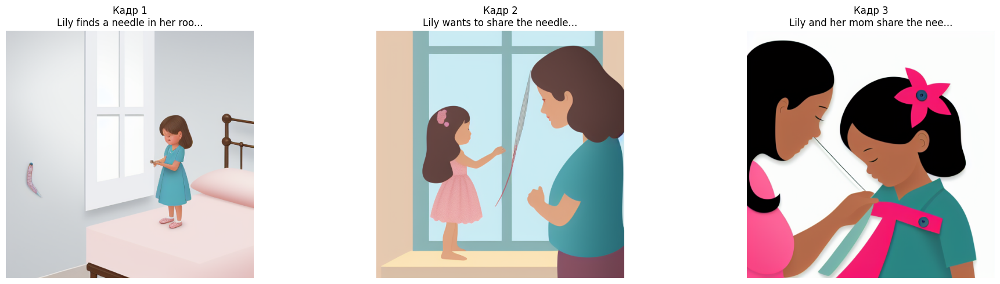

  5%|▌         | 1/20 [03:54<1:14:08, 234.16s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Beep loves to drive fast and play in the sun.', 'Beep enjoys playing with fallen leaves during his journey.', 'Beep needs more fuel to continue enjoying his adventures.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2817 | LPIPS: 1.0000
  Текст: Beep loves to drive fast and play in the sun....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2634 | LPIPS: 0.3275
  Текст: Beep enjoys playing with fallen leaves during his ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2229 | LPIPS: 0.3333
  Текст: Beep needs more fuel to continue enjoying his adve...


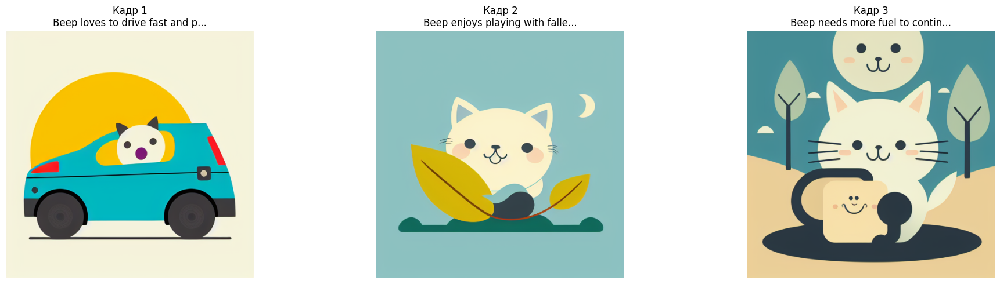

 10%|█         | 2/20 [06:57<1:01:17, 204.29s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Fin observed a crab near the shore.', 'Fin approached the crab and offered friendship.', "The crab turned down Fin's offer of friendship due to being cold. Fin decided to help the crab by thinking of a solution. Fin reached the top of the water"]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2827 | LPIPS: 1.0000
  Текст: Fin observed a crab near the shore....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2834 | LPIPS: 0.3103
  Текст: Fin approached the crab and offered friendship....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2668 | LPIPS: 0.2945
  Текст: The crab turned down Fin's offer of friendship due...


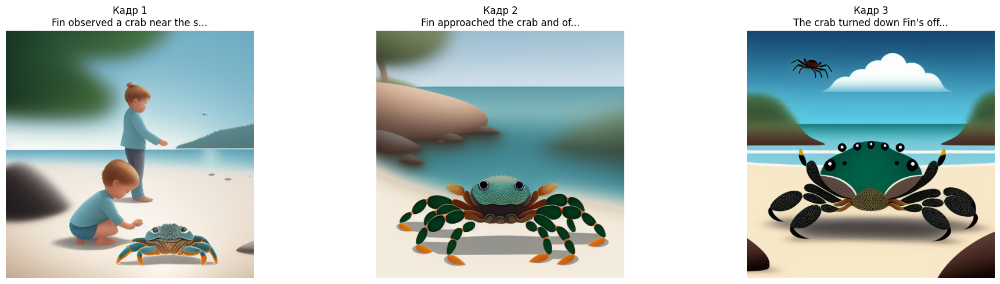

 15%|█▌        | 3/20 [09:59<54:55, 193.87s/it]  

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The cherry tree feels sad due to its lack of friends despite being surrounded by bigger trees.', "A spring wind tickles the cherry tree's branches, bringing hope.", 'The cherry tree grows more cherries, attracting animals for friendship.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3057 | LPIPS: 1.0000
  Текст: The cherry tree feels sad due to its lack of frien...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2454 | LPIPS: 0.4229
  Текст: A spring wind tickles the cherry tree's branches, ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2844 | LPIPS: 0.5957
  Текст: The cherry tree grows more cherries, attracting an...


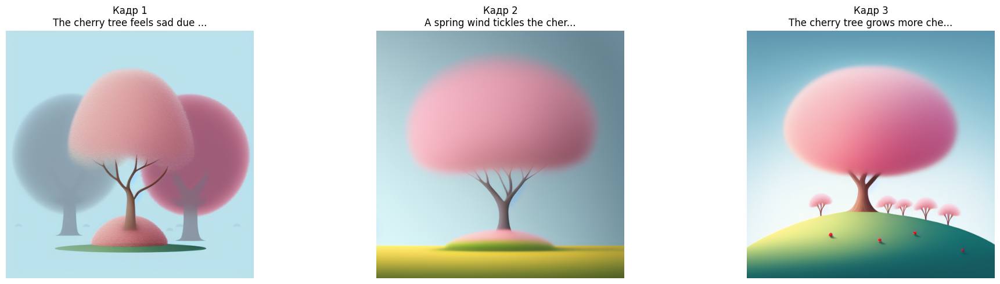

 20%|██        | 4/20 [13:00<50:23, 188.99s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Lily found a big cobweb blocking her game.', 'Lily was scared of the spider living inside the cobweb.', "Lily's friends, the cat and the dog, helped her remove the cobweb."]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2487 | LPIPS: 1.0000
  Текст: Lily found a big cobweb blocking her game....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3081 | LPIPS: 0.3648
  Текст: Lily was scared of the spider living inside the co...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2808 | LPIPS: 0.3892
  Текст: Lily's friends, the cat and the dog, helped her re...


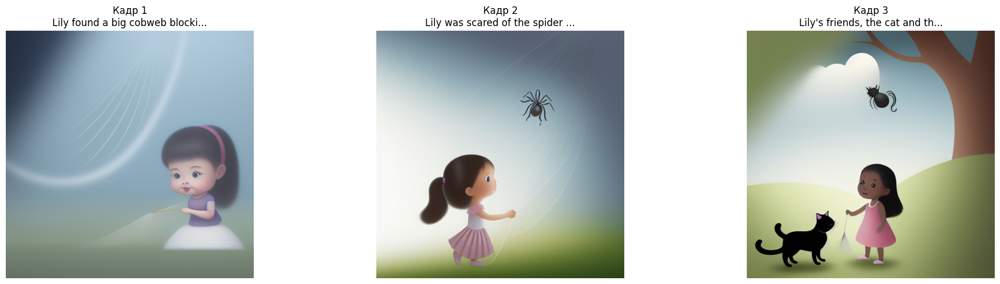

 25%|██▌       | 5/20 [16:01<46:32, 186.19s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['A child named Tim arrives at the lake.', 'Tim and the brown kayak engage in playful activities together.', 'Tim says goodbye to the brown kayak before leaving.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3042 | LPIPS: 1.0000
  Текст: A child named Tim arrives at the lake....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3135 | LPIPS: 0.3409
  Текст: Tim and the brown kayak engage in playful activiti...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2345 | LPIPS: 0.2379
  Текст: Tim says goodbye to the brown kayak before leaving...


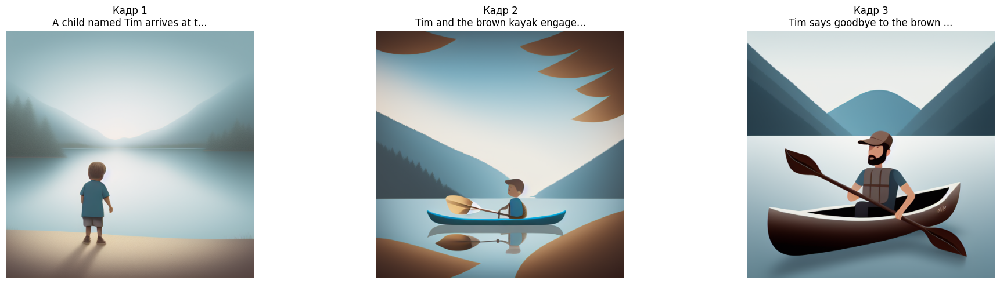

 30%|███       | 6/20 [19:02<43:00, 184.35s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Lily lost her favorite triangle toy.', 'Lily searched her entire house without success.', 'One sunny day, Lily visited the park where she noticed a puddle of water. In the puddle, Lily discovered her missing triangle toy. Lily']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2834 | LPIPS: 1.0000
  Текст: Lily lost her favorite triangle toy....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2050 | LPIPS: 0.4854
  Текст: Lily searched her entire house without success....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3098 | LPIPS: 0.5255
  Текст: One sunny day, Lily visited the park where she not...


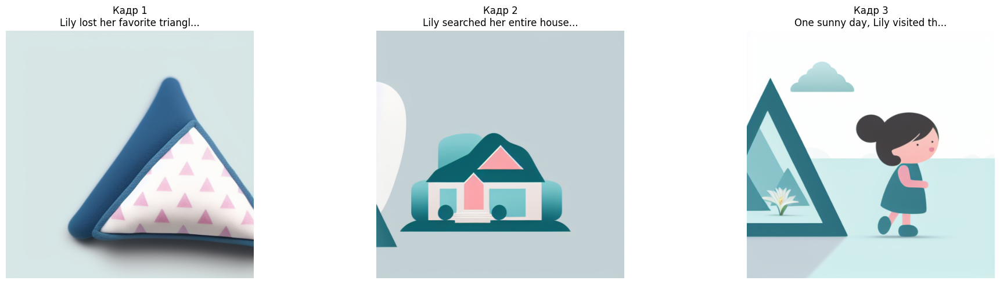

 35%|███▌      | 7/20 [22:03<39:44, 183.41s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tim sees a race in the park.', 'Tim and Sarah decide to participate in the race.', 'Tim and Sarah start running towards the finish line.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2489 | LPIPS: 1.0000
  Текст: Tim sees a race in the park....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2107 | LPIPS: 0.3052
  Текст: Tim and Sarah decide to participate in the race....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2178 | LPIPS: 0.2623
  Текст: Tim and Sarah start running towards the finish lin...


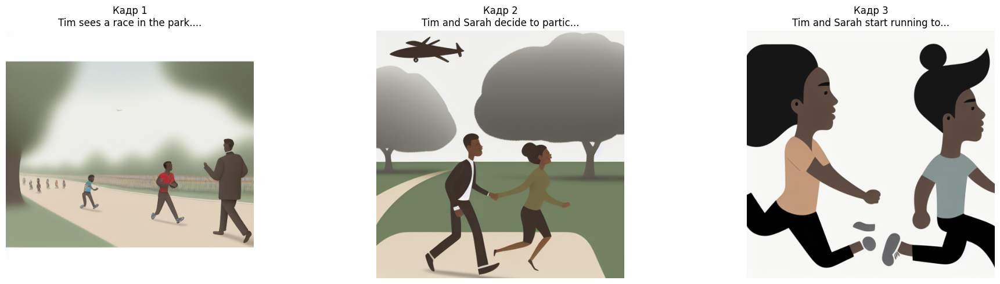

 40%|████      | 8/20 [25:05<36:32, 182.72s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Max falls and hurts his knee while playing at the park.', 'Max seeks help from the wise old owl.', "Max tests his knee by walking slowly under the owl's guidance and finds relief."]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2803 | LPIPS: 1.0000
  Текст: Max falls and hurts his knee while playing at the ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2191 | LPIPS: 0.3688
  Текст: Max seeks help from the wise old owl....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2450 | LPIPS: 0.3329
  Текст: Max tests his knee by walking slowly under the owl...


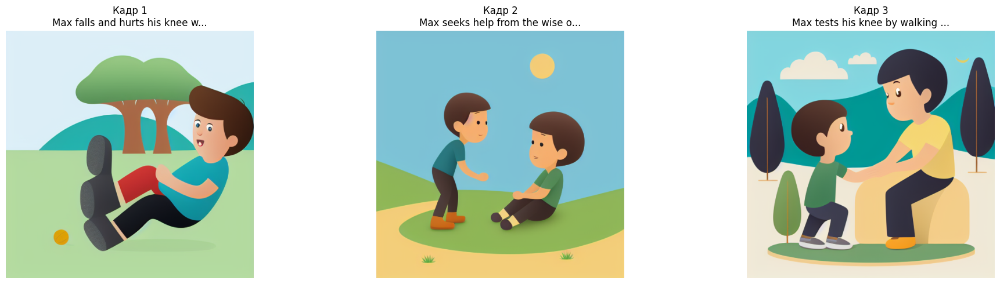

 45%|████▌     | 9/20 [28:06<33:24, 182.23s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tim started his journey in his fast car.', 'Tim greeted his friend Sam on the street.', 'Tim and Sam enjoyed their ride around the town while driving fast.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2737 | LPIPS: 1.0000
  Текст: Tim started his journey in his fast car....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2595 | LPIPS: 0.3214
  Текст: Tim greeted his friend Sam on the street....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2905 | LPIPS: 0.2592
  Текст: Tim and Sam enjoyed their ride around the town whi...


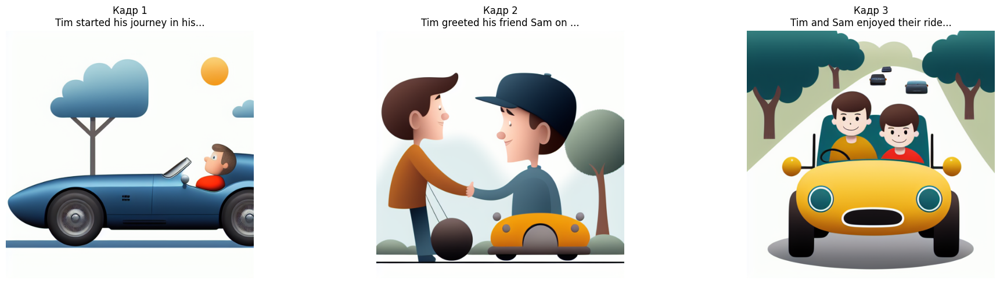

 50%|█████     | 10/20 [31:07<30:18, 181.81s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Describe the setting and initial situation.', "Mention the protagonist's role and responsibilities.", 'Introduce the key elements of the story (family members and the car).']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2428 | LPIPS: 1.0000
  Текст: Describe the setting and initial situation....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2245 | LPIPS: 0.2196
  Текст: Mention the protagonist's role and responsibilitie...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3018 | LPIPS: 0.3510
  Текст: Introduce the key elements of the story (family me...


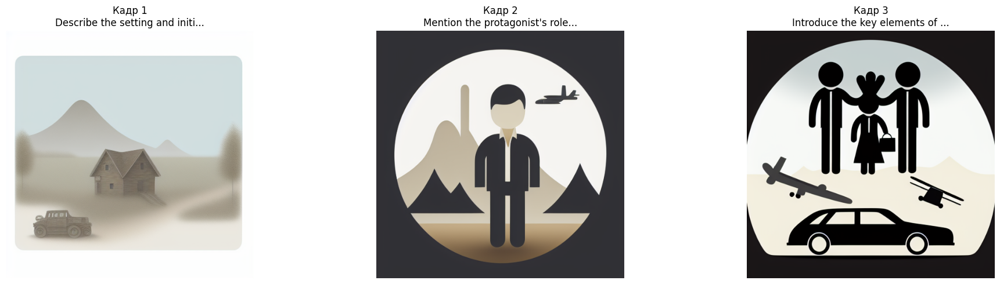

 55%|█████▌    | 11/20 [34:08<27:13, 181.50s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tim found a pencil on the ground.', 'Tim liked the pencil a lot and put it in his hat.', 'Tim drew pictures with the pencil and wore his dark hat every day.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2639 | LPIPS: 1.0000
  Текст: Tim found a pencil on the ground....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2981 | LPIPS: 0.2466
  Текст: Tim liked the pencil a lot and put it in his hat....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2568 | LPIPS: 0.2531
  Текст: Tim drew pictures with the pencil and wore his dar...


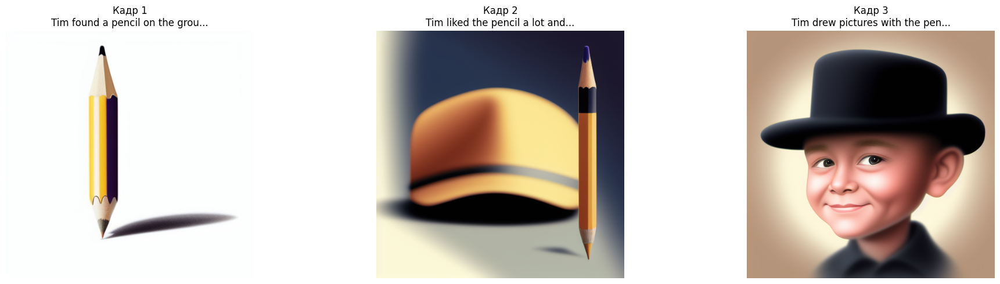

 60%|██████    | 12/20 [37:09<24:10, 181.35s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Mia goes for a walk', 'Mia sees a scary house', 'Mia helps the bird escape from its cage']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2844 | LPIPS: 1.0000
  Текст: Mia goes for a walk...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.1796 | LPIPS: 0.3110
  Текст: Mia sees a scary house...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2306 | LPIPS: 0.2948
  Текст: Mia helps the bird escape from its cage...


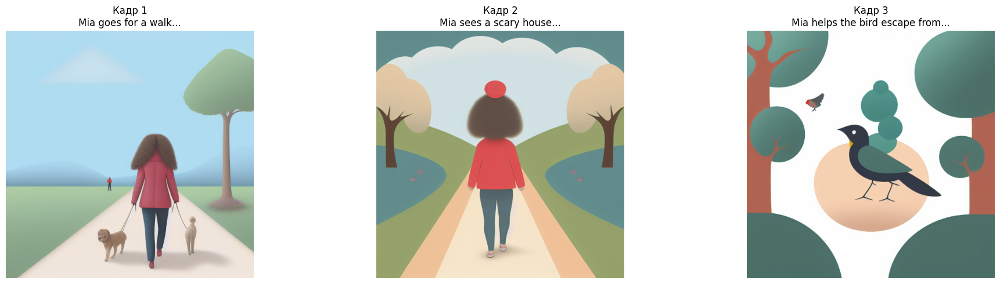

 65%|██████▌   | 13/20 [40:10<21:09, 181.29s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Amy woke up from her nap.', 'Amy heard a sound during the night.', 'Amy met a friendly ghost who offered to help her choose a dream.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2189 | LPIPS: 1.0000
  Текст: Amy woke up from her nap....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2360 | LPIPS: 0.3136
  Текст: Amy heard a sound during the night....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2274 | LPIPS: 0.3794
  Текст: Amy met a friendly ghost who offered to help her c...


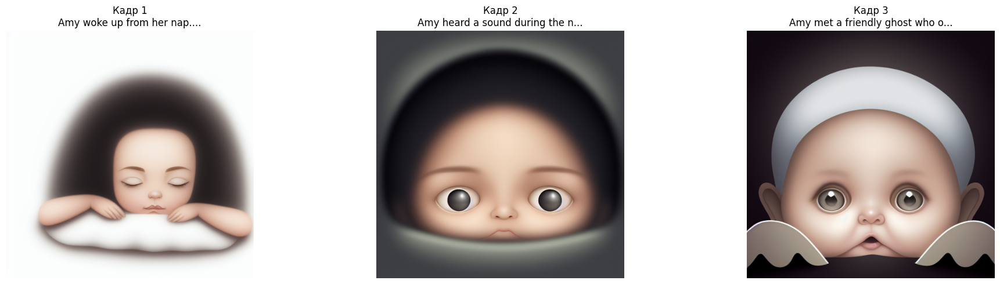

 70%|███████   | 14/20 [43:12<18:09, 181.58s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The mushroom calls out to the bunny for friendship.', "The bunny agrees to become the mushroom's friend.", 'The rabbit digs a hole for the mushroom to hide in during the hot days.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3411 | LPIPS: 1.0000
  Текст: The mushroom calls out to the bunny for friendship...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3391 | LPIPS: 0.3239
  Текст: The bunny agrees to become the mushroom's friend....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3210 | LPIPS: 0.3420
  Текст: The rabbit digs a hole for the mushroom to hide in...


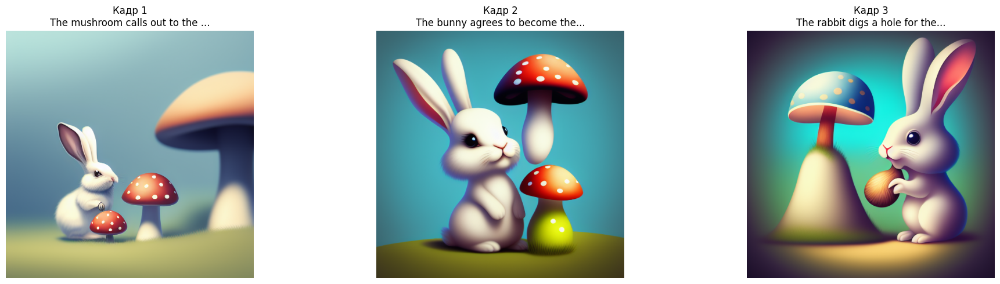

 75%|███████▌  | 15/20 [46:14<15:08, 181.67s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The queen went to the park to relax.', 'The queen sat on a soft, green grass.', 'The queen saw a bug and disliked it.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2629 | LPIPS: 1.0000
  Текст: The queen went to the park to relax....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3044 | LPIPS: 0.2413
  Текст: The queen sat on a soft, green grass....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2676 | LPIPS: 0.2446
  Текст: The queen saw a bug and disliked it....


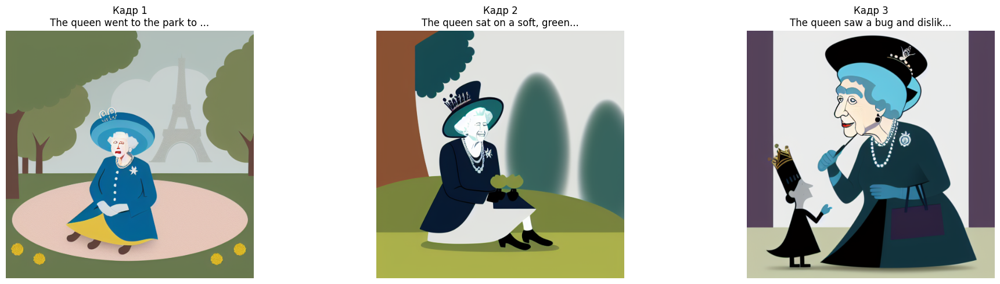

 80%|████████  | 16/20 [49:15<12:05, 181.46s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The story begins with describing the setting and initial interactions between Fluffy (a little white cat) and Timmy (a small boy).', 'Fluffy loves playing with Timmy and often chases him outdoors during sunny days.', 'Timmy learns a new word ("repeat") from school']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3005 | LPIPS: 1.0000
  Текст: The story begins with describing the setting and i...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2637 | LPIPS: 0.3365
  Текст: Fluffy loves playing with Timmy and often chases h...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2181 | LPIPS: 0.2140
  Текст: Timmy learns a new word ("repeat") from school...


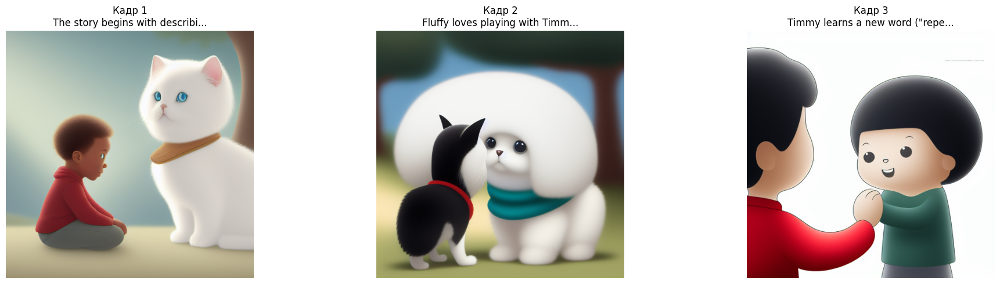

 85%|████████▌ | 17/20 [52:17<09:04, 181.57s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The octopus and the fish find a big jug.', 'The octopus and the fish decide to pour water on their friends.', 'The octopus and the fish share the responsibility of pouring the water together.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3140 | LPIPS: 1.0000
  Текст: The octopus and the fish find a big jug....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2893 | LPIPS: 0.2066
  Текст: The octopus and the fish decide to pour water on t...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3169 | LPIPS: 0.2820
  Текст: The octopus and the fish share the responsibility ...


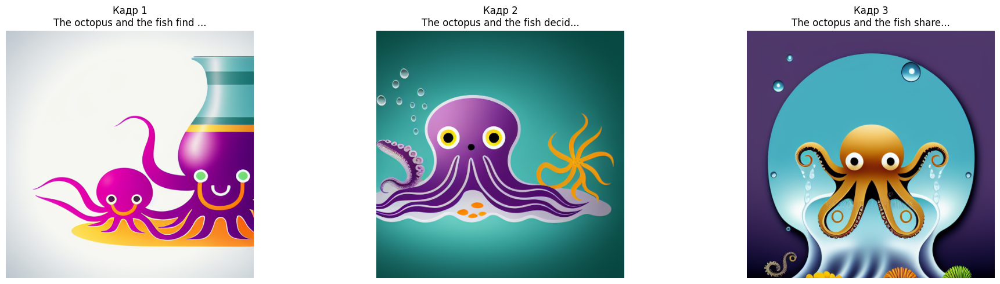

 90%|█████████ | 18/20 [55:18<06:02, 181.47s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tom found a hoop in the yard.', 'Tom tried to make the hoop smaller by stretching it.', 'Tom successfully made the hoop smaller and played with it.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2754 | LPIPS: 1.0000
  Текст: Tom found a hoop in the yard....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2064 | LPIPS: 0.3061
  Текст: Tom tried to make the hoop smaller by stretching i...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2219 | LPIPS: 0.3426
  Текст: Tom successfully made the hoop smaller and played ...


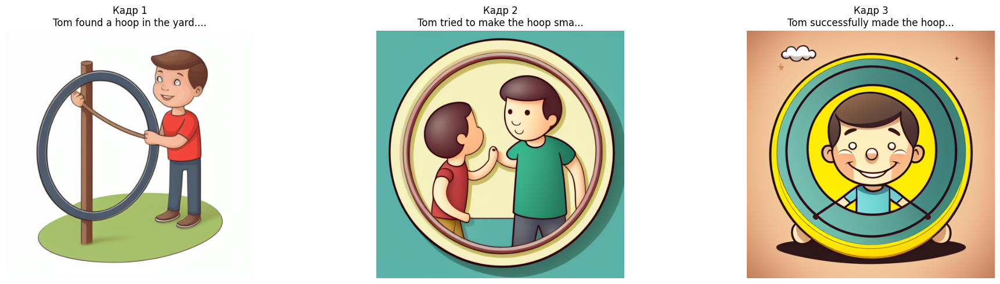

 95%|█████████▌| 19/20 [58:19<03:01, 181.36s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


["The polite crab encountered a new friend who didn't know how to play.", 'The crab taught the new friend how to play by demonstrating.', 'The two friends spent the entire day playing together and having great fun.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3481 | LPIPS: 1.0000
  Текст: The polite crab encountered a new friend who didn'...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2920 | LPIPS: 0.4153
  Текст: The crab taught the new friend how to play by demo...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2382 | LPIPS: 0.2102
  Текст: The two friends spent the entire day playing toget...


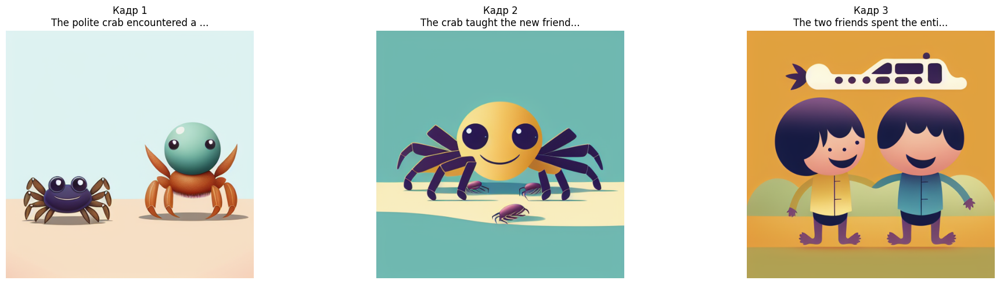

100%|██████████| 20/20 [1:01:20<00:00, 184.05s/it]


In [17]:
clip_ls = []
lpip_ls = []
for i in tqdm(range(20)):
    
    best_frames, best_clips, best_lpips = gen_img_sequential(stories[i])
    
    #save_images(best_frames, num_act=i)
    
    clip_ls.append(np.mean(best_clips))
    lpip_ls.append(np.mean(best_lpips))

In [ ]:
print('CLIP:  ',100*np.mean(clip_ls))
print('LPIPS: ',100*np.mean(lpip_ls))

CLIP:   19.76127115885417
LPIPS:  40.9031348824501
